In [6]:
import numpy as np
import random
from scipy.linalg import eig
import pandas as pd
import matplotlib.pyplot as plt
import math

In [89]:

class Chrom:
    
    def __init__(self, flt = None, binar = None, L = 20):
        self.flt = flt
        self.binar = binar
        self.L = L
        self.parent = None
        
        if self.flt is None and self.binar is not None:
            self.set_from_bin()
        
        elif self.binar is None and self.flt is not None:
            self.set_from_flt()
        
        else:
            self.flt = 420.69696969
            self.set_from_flt()
    
    def set_from_flt(self, flt = None):
        if flt is None:
            flt = self.flt
        self.flt = flt
        self.binar = self.to_bin()
        
    def set_from_bin(self, binar = None):
        if binar is None:
            binar = self.binar
        self.binar = binar
        self.flt = self.to_flt()
        
    
    #converts float to binary
    def to_bin(self, flt = None):
        if flt is None:
            flt = self.flt
        
        def decimal_converter(num): 
            while num > 1:
                num /= 10.0
            return num

        whole, dec = str(self.flt).split(".")
        whole = int(whole)
        dec = int (dec)
        res = bin(whole).lstrip("0b") + "."
        for x in range(self.L):
            whole, dec = str((decimal_converter(dec)) * 2.0).split(".")
            dec = int(dec)
            res += whole

        return res

    #converts binary to float
    def to_flt(self, binar = None):
        if binar is None:
            binar = self.binar
        if binar[0] == '.':
            binar = "0" + binar
        integ, dec  = str(binar).split(".")
        i = int(integ, 2)
        d = int(dec, 2)
        d = d * 1.0 / (2**(len(dec)))
        return i + d
    
    
    #mutates the parent binary to make a parent and larva (larva saved as self.binar)
    def mutate(self):
        self.parent = self.binar
        temp_binar = list(self.binar)
        g = random.randint(1, self.L + 1)
        n = 0
        selected = []
        while n <= g:
            i = random.randint(0, len(self.binar) - 1)
            if i not in selected and temp_binar[i] is not ".":
                n += 1
                selected.append(i)
                if g == 1:
                    P = 1
                else:
                    P = 1.0/math.log(g)
                mutant = random.choices([False, True], [P, 1-P])[0]
                if mutant: 
                    if temp_binar[i] is '0':
                        temp_binar[i] = '1'
                    else:
                        temp_binar[i] = '0'
        self.binar = "".join(temp_binar)
                
    #randomly chooses bases from parent and larva to make bud
    def reproduce(self):
        self.mutate()
        par = list(self.parent)
        larv = list(self.binar)

        for i in range(0, len(larv)):
            mutate = random.choices([True, False], [0.5, 0.5])[0]
            if mutate:
                larv[i] = par[i]

        self.binar = "".join(larv)
        self.set_from_bin()
        

In [96]:
class HMM:
    
    def __init__(self, A, E, outputs):
        self.A = A
        self.E = E
        self.outputs = outputs
        outdic = {}
        for i in range(0, len(outputs)):
            key = outputs[i]
            outdic[key] = i
        self.outdic = outdic
        self.nodes = len(A[0])
        self.pi = self.stable_pi()
        
        self.lastA = np.copy(A)
        self.lastE = np.copy(E)

    def stable_pi(self):
        w, vl, vr = eig(A, left=True)
        pi = None
        for j in range(0, vl.shape[1]):
            if all (x > 0 for x in vl[:, j]) or all (x < 0 for x in vl[:, j]):
                pi = vl.real[:,j]/sum(vl.real[:,j])
                self.pi = pi
                return pi
        if type(pi) is type(None):
            """
            print("Issue with eigenvalues; manually select which column (starting at 0)")
            print(vl)
            col = int(input())
            """
            col = 0
            pi = vl.real[:,col]/sum(vl.real[:,col])
        self.pi = pi
        return pi
    
    def run(self, num_it, start = None):
        states = []
        res = []
        picurr = np.zeros(self.nodes)
        if type(start) is type(None):
            start = np.random.choice(np.arange(0, self.nodes), p=self.pi)
        picurr[start] = 1
        prev = start
        states.append(start)
        curr = 0
        for i in range(0, num_it):
            #choose which node we're moving to
            curr = np.random.choice(np.arange(0, self.nodes), p=list(np.matmul(picurr, A)))
            picurr[prev] = 0
            picurr[curr] = 1
            prev = curr
            states.append(curr)
            #choose the output
            out = np.random.choice(outputs, p=list(E[curr]))
            res.append(out)
        return res, states
        
    #probability that the HMM generated the results
    def forward_algorithm(self, res):
        results = np.array(res)
        alpha_max = len(results)
        forwardmat = np.zeros((self.nodes, alpha_max))
        #add first col
        for i in range(0, self.nodes):
            #alpha1(Xi)
            output_index = self.outdic[results[alpha_max -1]] 
            forwardmat[i, 0] = self.pi[i]*self.E[i, output_index]

        #now calculate each of the following rows
        for j in range(1, alpha_max):
            for i in range(0, self.nodes):
                s = 0
                for prevrowi in range(0, self.nodes):
                    alpha_iminus1 = forwardmat[prevrowi, j-1]
                    prob_xi_given_ximinus1 = self.A[prevrowi, i]
                    output_index = self.outdic[results[alpha_max -(j+1)]] 
                    prob_result_given_x = self.E[i, output_index]
                    s = s + alpha_iminus1*prob_xi_given_ximinus1*prob_result_given_x
                forwardmat[i, j] = s
        return forwardmat, sum(forwardmat[:, alpha_max -1])
        
    def all_combos(self, num_out):
        options = np.ndarray((len(self.outputs)**num_out, num_out), dtype = object)
        for col in range(0, num_out):
            row = 0
            while row < len(self.outputs)**num_out:
                for element in self.outputs:
                    for it in range(0, len(self.outputs)**col):
                        options[row, col] = element
                        row = row + 1
        return options
    
    def backward_algorithm(self, res):
        results = np.array(res)
        L = len(results)
        backwardmat = np.zeros((self.nodes, L+1))
        
        #setting the last row
        for i in range(0, self.nodes):
            backwardmat[i, L] = 1 
        
        t = L-1
        while t >=0:
            for i in range(0, self.nodes): #i is the state
                s = 0
                for j in range(0, self.nodes):
                    aij = self.A[i, j]
                    o_t_plus_1 = self.outdic[results[t]]
                    bjo_t_plus_1 = self.E[j, o_t_plus_1]
                    beta_t_plus_1 = backwardmat[j, t+1]
                    s = s + aij*bjo_t_plus_1*beta_t_plus_1
                backwardmat[i, t] = s
            t = t -1
        return backwardmat
    
    def zeta(self, i, j, t, res, forward, backward): #t between 0 and the len(res)
        if t < 0 or t >= len(res):
            raise Exception("t is incorrect. t must be such that: 0 <= t < len(res)")
        
        alpha_t_i = forward[i, len(res) -1 -t ] #prob of res[0:t] given tth node is i
        a_ij = self.A[i, j] #prob going from node i to j
        out_index_of_t_plus_1 = self.outdic[res[t+1]] 
        b_j_o_t_plus_1 = self.E[j, out_index_of_t_plus_1] #probability that node j outputted the t+1th output
        beta_t_plus_1_j = backward[j, len(res) -t] #probability of output[t+1:] given node t+1 is j
        sum_alpha_tj_times_beta_tj = 0
        for j_temp in range(0, self.nodes):
            sum_alpha_tj_times_beta_tj = sum_alpha_tj_times_beta_tj + (forward[j_temp, len(res) -1 -t]*backward[j_temp, len(res)-1-t])
        zeta = alpha_t_i * a_ij * b_j_o_t_plus_1 * beta_t_plus_1_j / sum_alpha_tj_times_beta_tj
        return zeta
    
    def new_a_i_j(self, i, j, res, forward, backward):
        if len(res) <= 2:
            raise ValueException("Length of res must be greater than 2 or else why are u using this equation")
        s_zeta_i_j = 0
        for t in range(0, len(res)-1):
            s_zeta_i_j = s_zeta_i_j + self.zeta(i, j, t, res, forward, backward)
        s_zeta_all_j_all_t = 0
        for t in range(0, len(res)-1):
            for node in range(0, self.nodes):
                x = self.zeta(i, node, t, res, forward, backward) 
                s_zeta_all_j_all_t = s_zeta_all_j_all_t + x
        if s_zeta_i_j/s_zeta_all_j_all_t == 0:
            return self.lastA[i, j] * .5
        return s_zeta_i_j/s_zeta_all_j_all_t
    
    def b_j_o(self, j, out, res, forward, backward):
        num = 0
        den = 0
        for t in range(0, len(res)):
            gamma_top = forward[j, len(res) - 1 -t] *backward[j, len(res) -1-t]
            gamma_denom = 0 
            for j_temp in range(0, self.nodes):
                gamma_denom = gamma_denom + (forward[j_temp, len(res) -1 -t]*backward[j_temp, len(res)-1-t])
            gamma = gamma_top/gamma_denom
            den = den + gamma
            if (type(out) is type('A') and res[t] == out) or (self.outdic[res[t]] == out):
                num = num+gamma
        if num/den == 0: #this will happen if a specific out isn't in a result
            if type(out) is type('A'):
                index = self.outdic[out]
                return self.lastE[j, index] *.5 
            else: 
                return self.lastE[j, out] *.5
                
        return num/den
    
    def train(self, res):
        backward = self.backward_algorithm(res)
        forward = self.forward_algorithm(res)[0]
        new_A = np.zeros(self.A.shape)
        new_E = np.zeros(self.E.shape)
        for i in range(0, self.nodes):
            for j in range(0, self.nodes):
                new_A[i, j] = self.new_a_i_j(i, j, res, forward, backward)
        for j in range(0, self.nodes):
            for out in self.outputs:
                out_index = self.outdic[out]
                new_E[j, out_index] = self.b_j_o(j, out_index, res, forward, backward)
        is_good = 1
        for i in range(0, new_A.shape[0]):
            for j in range(0, new_A.shape[1]):
                if math.isnan(new_A[i, j]):
                    print("NAN in A")
                    print("E")
                    print(self.E)
                    print("A")
                    print(self.A)
                    print("Res")
                    print(res)
                    is_good = 0
        for i in range(0, new_E.shape[0]):
            for j in range(0, new_E.shape[1]):
                if math.isnan(new_E[i, j]):
                    print("NAN IN E")
                    print("E")
                    print(self.E)
                    print("A")
                    print(self.A)
                    print("Res")
                    print(res)
                    is_good = -1
                    
                    
        new_A = self.normalize(new_A)
        new_E = self.normalize(new_E)
        distance_A = self.distance(self.A, new_A) #euclidian dist from old to new A and E
        distance_E = self.distance(self.E, new_E)
        self.lastA = np.copy(self.A)
        self.lastE = np.copy(self.E)
        
        self.A = np.copy(new_A)
        self.E = np.copy(new_E)
        self.pi = self.stable_pi()
        
        return distance_A, distance_E, is_good
    
    def distance(self, X, Y):
        dist = np.linalg.norm(X - Y)
        return dist
    
    def random_init(self):
        A_temp = np.random.rand(self.A.shape[0], self.A.shape[1])
        E_temp = np.random.rand(self.E.shape[0], self.E.shape[1])
        for i in range(0, A_temp.shape[0]):
            self.A[i] = A_temp[i]/sum(A_temp[i])
            self.E[i] = E_temp[i]/sum(E_temp[i])
        self.pi = self.stable_pi()
        
    def normalize(self, temp):
        for i in range(0, temp.shape[0]):
            temp[i] = temp[i]/sum(temp[i])
        return temp
            
        

In [152]:
import numpy as np

class ARO_HMM:
    
    def __init__(self, A, E, outputs):
        #make sure all the dimensions of inputs are correct
        assert A.shape[0] == A.shape[1] == E.shape[0]
        assert E.shape[1] == len(outputs)
        
        self.outputs = outputs
       
        #randomly initialize if the sums of the elements in A and E row-wise are not all 1
        
        for row in A:
            randinit = False
            s = 0.0
            for element in row: 
                s += element
            if s != 1.0:
                randinit = True
        if randinit:
            A = self.normalize(np.random.rand(A.shape[0], A.shape[1]))
            print("Randomly initializing A (transition probabilities) with %d nodes" % A.shape[0])
        
        for row in E:
            randinit = False
            s = 0.0
            for element in row:
                s+=element
            if s != 1.0:
                randinit = True
        if randinit:
            E = self.normalize(np.random.rand(E.shape[0], E.shape[1]))
            print("Randomly initializing E (emission probabilities) with %d nodes and %d outputs" % (E.shape))
        
        self.ARO_A = self.aro_mats(A)
        self.ARO_E = self.aro_mats(E)
        self.HMM = HMM(A, E, outputs)
        
        self.larv_A = None
        self.larv_E = None
        self.larv_HMM = None
      
        
    def normalize(self, temp):
        for i in range(0, temp.shape[0]):
            temp[i] = temp[i]/sum(temp[i])
        return temp
    
    def aro_mats(self, mat):
        temp = np.empty(mat.shape, dtype = object)
        for i in range(0, mat.shape[0]):
            for j in range(0, mat.shape[1]):
                #making the value larger so more is before the decimal point
                temp[i, j] = Chrom(flt = 100*mat[i, j])
                
        return temp
    
    def reproduce(self):
        #start by changing every value every time
        #then cross over the parent and larva matrices to make the actual larva that you test
        
        def larv_mat(mat):
            larv = np.zeros(mat.shape)
            ARO_larv = np.empty(mat.shape, dtype = object)
            for i in range(0, mat.shape[0]):
                for j in range(0, mat.shape[1]):
                    mat[i, j].reproduce()
                    larv[i, j] = mat[i, j].flt * 0.01
                    ARO_larv[i, j] = mat[i, j]
            return larv, ARO_larv
        
        larv_A_flt, self.larv_A = larv_mat(self.ARO_A) 
        larv_E_flt, self.larv_E  = larv_mat(self.ARO_E)
        self.larv_HMM = HMM(larv_A_flt, larv_E_flt, self.outputs)
        
    def train(self, res):
        fwdmat_larv = self.larv_HMM.forward_algorithm(res)[0]
        larv_score = sum(fwdmat_larv[:, fwdmat_larv.shape[0] - 1])

        fwdmat_parent = self.HMM.forward_algorithm(res)[0]
        parent_score = sum(fwdmat_parent[:, fwdmat_parent.shape[0] - 1])
        
        if larv_score > parent_score:
            self.ARO_A =  self.larv_A
            self.ARO_E =  self.larv_E
            self.HMM = self.larv_HMM
            return True, larv_score

        return False, parent_score



In [179]:
#each ith row is the probabilities of moving to the jth node of that row given you're at the ith node
A = np.array([[0.2, 0.6, 0.2], [0.3, 0, 0.7], [0.2, 0.8, 0]]) 
#each ith row is the probability of outputting the jth output given you're at the ith node
E = np.array([[.1, 0.4, .5, 0], [.3, .5, 0, 0.2], [0.3, 0, .4, .3]])
#all possible outputs of the HMM
outputs = np.array(['A', 'C', 'T', 'G'])
creator = HMM(A, E, outputs)
res = creator.run(20)[0]
res


['C',
 'A',
 'T',
 'A',
 'A',
 'G',
 'G',
 'T',
 'A',
 'A',
 'T',
 'C',
 'G',
 'C',
 'A',
 'C',
 'T',
 'T',
 'C',
 'G']

In [153]:
A = np.zeros((3, 3))
E = np.zeros((3, 4))
outputs = np.array(['A', 'C', 'T', 'G'])
aro_model = ARO_HMM(A, E, outputs)
aro_model.reproduce()
better, score = aro_model.train(res)

Randomly initializing A (transition probabilities) with 3 nodes
Randomly initializing E (emission probabilities) with 3 nodes and 4 outputs


In [193]:
A = np.zeros((3, 3))
E = np.zeros((3, 4))
outputs = np.array(['A', 'C', 'T', 'G'])
aro_model = ARO_HMM(A, E, outputs)

runs = [0]
scores = [0]
mutations = 0
i = 1
while mutations < 10:
    aro_model.reproduce()
    better, score = aro_model.train(res)
    if scores[len(scores) - 1] != score:
        mutations += 1
    scores.append(score)
    runs.append(i)
    i += 1
    print(score)
    


Randomly initializing A (transition probabilities) with 3 nodes
Randomly initializing E (emission probabilities) with 3 nodes and 4 outputs
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352


0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352


0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352


0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352


0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352


0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352
0.02865961420194352


0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572


0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572


0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572


0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572


0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572


0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572


0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572


0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572


0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572


0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572


0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572
0.03242001000425572


0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.03377772169

0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.033777721692996636
0.03377772169

0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348
0.03395876586288348


0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532


0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532


0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532


0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532


0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532


0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532


0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532


0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532
0.03598931873621532


0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981


0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981


0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981


0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981


0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981


0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981


0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981


0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981


0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981


0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981


0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981


0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981


0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981


0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981


0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981


0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981


0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981


0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981


0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981


0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981


0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981


0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981


0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981


0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981


0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981


0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981


0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981


0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981


0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981


0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981
0.03986096773193981


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112
0.04102233006504112


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696
0.04596344540130696


KeyboardInterrupt: 

Text(0.5, 1.0, 'ARO HMM Score over time')

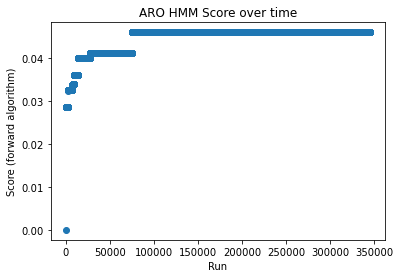

In [196]:
plt.scatter(runs, scores)
plt.xlabel("Run")
plt.ylabel("Score (forward algorithm)")
plt.title("ARO HMM Score over time")

In [178]:
print(scores)

[0.0073539918024757445]
